# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 2. Простой анализ данных.

**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds23_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`** и html-версии графиков (подробности в условии).
* Телеграм не разрешает боту получать файлы более **20 Мб**. Если ваше решение весит больше, *заранее* разделите ноутбук на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания **используйте этот ноутбук в качестве основы, ничего не удаляя из него**. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.

**Перед выполнением задания посмотрите презентацию по выполнению и оформлению домашних заданий с занятия 1.**

---

**Баллы за задание:**

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 2 &mdash; 80 баллов

---

In [1]:
# Bot check

# HW_ID: fpmi_ad2
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly
import plotly.graph_objects as go
import plotly.express as px

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')


---
### <font color="orange"><i>Сложная часть</i></font>

### Задача 2

<a target="_blank" href="https://www.yelp.com/">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

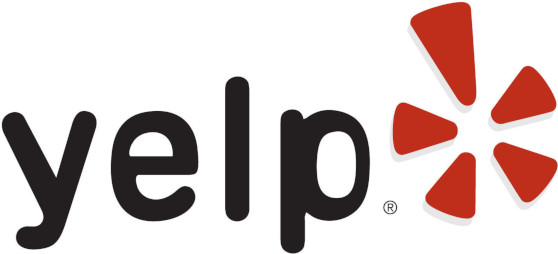

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>, но использовать нужно выданные данные.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.


*Далее в условии встречаются различные подсказки, как можно выполнить определенные части задачи. Вы можете их игнорировать и делать иным способом для получения **того же самого промежуточного результата**. Однако, если ваше решение окажется **значительно** менее эффективным (по скорости, количеству и красоте кода) по сравнению с предполагаемым, баллы могут быть снижены.* 

------

#### 1. Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [3]:
data = pd.read_csv('~/mipt-stats/task2/yelp_business.csv')
data.head()

,Unnamed: 0,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [4]:
city_count = data.groupby('city').count().sort_values(
    by='name',
    ascending=False)['name']  # "Информацией по компании считаем её имя"

print(city_count.head().to_string(index=True))  # Уберём dtype

city
Las Vegas     26775
Phoenix       17213
Toronto       17206
Charlotte      8553
Scottsdale     8228


Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

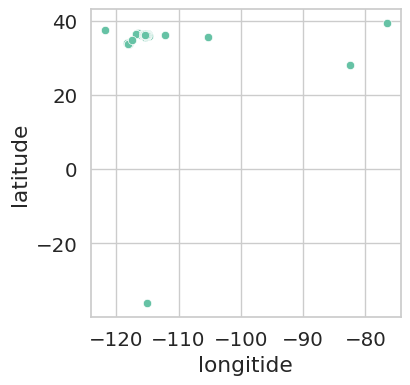

In [5]:
n_city_name = city_count.index[0]  # Название города
n_city = data[data.city == n_city_name]

plt.figure(figsize=(4, 4))
sns.scatterplot(data=n_city, x='longitude', y='latitude')
plt.xlabel('longitide')
plt.ylabel('latitude')

plt.show()

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. На этом графике должны выделяться некоторые улицы. 

Удалим выбросы

In [6]:
n_city = n_city[(n_city.longitude < -114.9)
                & (n_city.longitude > -115.5) & (n_city.latitude > 35.9) &
                (n_city.latitude < 36.5)]

Построим график

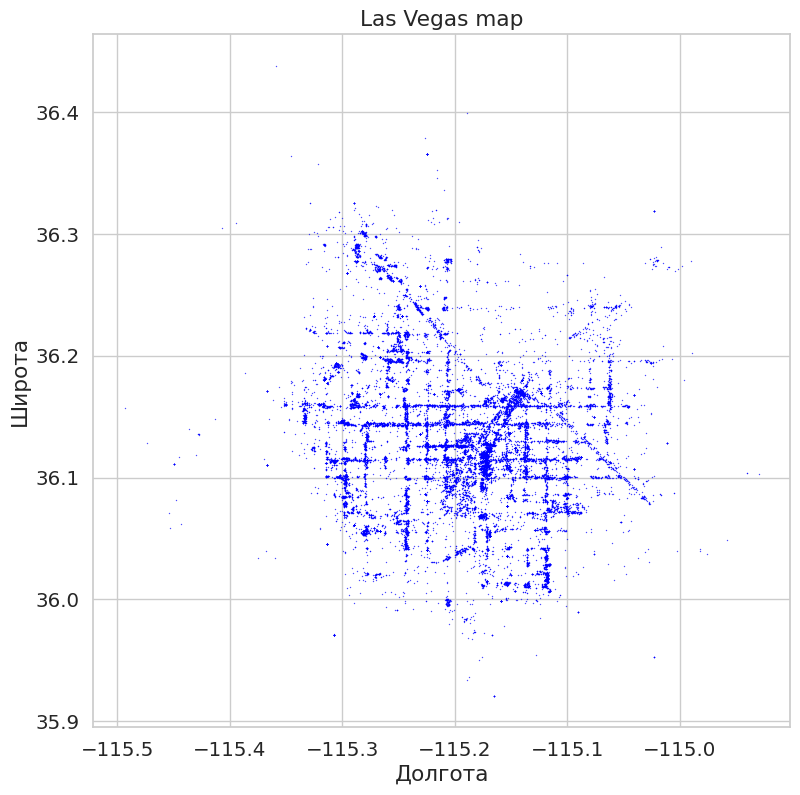

In [7]:
plt.figure(figsize=(9, 9))
sns.scatterplot(data=n_city,
                x='longitude',
                y='latitude',
                linewidth=0,
                alpha=0.7,
                color='blue',
                s=1)

plt.title(f"{n_city_name} map")
plt.xlabel('Долгота')
plt.ylabel('Широта')

plt.show()

Видно, что компании распологаются вдоль одних улиц

Разберитесь с тем, как подгрузить интерактивную карту города в качестве фона графика. Можно пойти двумя следующими способами.
1. Изучить <a href="https://miptstats.github.io/courses/python/11_plotly.html" target="_blank">материалы</a> по библиотеке <a href="https://plotly.com/python/" target="_blank"><b>Plotly</b></a>. Возможно, потребуется также заглянуть в документацию.
1. Поразбираться с библиотекой <a href="https://github.com/python-visualization/folium" target="_blank"><b>Folium</b></a>. Посмотрите множество <a href="https://nbviewer.org/github/python-visualization/folium/tree/main/examples/" target="_blank">примеров</a>, может также помочь <a href="https://proglib.io/p/python-web-map" target="_blank">статья на русском</a>.

*Внимание!* Интерактивная карта может не сохраниться в ноутбуке, а если сохранится, то вес ноутбука может превзойти 20 Мб, и его не получится отправить боту. В любом случае **<u>необходимо сохранить карту в html и отправить ее отдельным файлом в бот.</u>** При этом каждый файл html должен не превышать 20 Мб, присылать файлы в архиве нельзя. Аналогично со всеми следующими интерактивными графиками в этом задании.

In [8]:
fig = px.scatter_mapbox(n_city,
                        lat='latitude',
                        lon='longitude',
                        hover_name="name",
                        hover_data=None,
                        zoom=10,
                        width=800,
                        height=500,
                        title="Las Vegas' businesses")

# Добавим карту
fig.update_layout(title_x=0.5, title_y=0.95, mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()
plotly.offline.plot(fig, filename='map1.html', auto_open=False)

Если все получилось, вы молодцы! Далее в этой задаче тоже стройте интерактивные карты. Если нет желания разбираться с интерактивными графиками, можно построить статичные, но баллы будут снижены.

#### 2. Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [9]:
reviews = pd.read_csv('~/mipt-stats/task2/yelp_review.csv')
reviews.set_index('business_id', inplace=True)

В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [10]:
reviews = reviews.loc[n_city['business_id']]

Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [11]:
rating = reviews.groupby('business_id').aggregate([np.mean,
                                                   np.size]).iloc[:, [2, 3]]

Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша :)

In [12]:
rating.columns = ['Средняя оценка', 'Число отзывов']
print(rating.round(2).head())  # Вывод с округлением оценки до 2-х знаков

                        Средняя оценка  Число отзывов
business_id                                          
--9e1ONYQuAa-CB_Rrw7Tw            4.09           1451
--DdmeR16TRb3LsjG0ejrQ            3.20              5
--WsruI0IGEoeRmkErU5Gg            4.93             14
--Y7NhBKzLTbNliMUX_wfg            4.88              8
--e8PjCNhEz32pprnPhCwQ            3.47             19


Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, а также две колонки со средней оценкой компаний и количеством оценок, которые вы посчитали выше.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [13]:
n_city.set_index('business_id')

joined = rating.join(
    n_city.set_index(
        'business_id').loc[:, ['name', 'latitude', 'longitude', 'categories']])

Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$. Если у одной компании несколько филиалов с разными адресами, наносите на график все адреса.

In [14]:
fig2 = px.scatter(joined,
                  y='latitude',
                  x='longitude',
                  color='Средняя оценка',
                  hover_name="name",
                  hover_data=['Средняя оценка', 'Число отзывов'],
                  width=800,
                  height=800,
                  opacity=0.3,
                  color_continuous_scale=px.colors.diverging.RdYlGn
                  )  # Установим привычную шкалу "светофор"

fig2.update_layout(
    title_text="Средняя оценка посетителей",
    title_font_size=20,
    yaxis_title="Широта",
    xaxis_title="Долгота",
)
fig2.update_traces(marker_size=5)

fig2.show()
plotly.offline.plot(fig2, filename='map2.html', auto_open=False)

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [15]:
neighborhoods = joined.copy()
neighborhoods.latitude = np.round(joined.latitude * 4, decimals=1) * 0.25
neighborhoods.longitude = np.round(joined.longitude * 4, decimals=1) * 0.25

Для получения средней оценки компаний по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

*Замечание.* В качестве среднего можно было бы посчитать как общее среднее по всем оценкам всех компаний, так и среднее по компаниям их средних оценок. В чем разница этих подходов? Какой из них необходимо использовать в данном случае?

В случае если считать общее среднее по всем оценкам всех компаний, мы посчитаем среднюю оценку поставленную любой компании из данного района, и не будет иметь значения к какой компании из данного района относиться отзыв. Если же считать среднее по компаниям их средних оценок, то мы получим характеристику района, основанную на рейтинге компаний в данном районе.

Другими словами способы отличаются тем, что мы называем хорошим районом: тот в котором люди в целом довольны компаниями, или тот в котором в целом неплохие компании.

Так как нас явно попросили определить районы с качественными услугами, среднее необходимо считать как общее среднее по оценкам всех компаний, так как нас интересует качество услуг оказанных в данном районе. Мы расчитываем оценку району как среднее по всем оценкам оставленным в данном районе. Если же считать среднее вторым способом, то получается что незаментый ларёк с 1-м отзывом имеет тот же вклад в оценку района, что и огромное казино с 1000-ю отзывов.

In [16]:
neighborhood_rating = pd.pivot_table(
    neighborhoods,
    index='latitude',
    columns='longitude',
    values='Средняя оценка',
    aggfunc=lambda rows: np.average(
        rows, weights=neighborhoods.loc[rows.index, 'Число отзывов']))

# Смена ориентации карты на Юг - Снизу:
neighborhood_rating = neighborhood_rating.iloc[::-1]

Построим heatmap

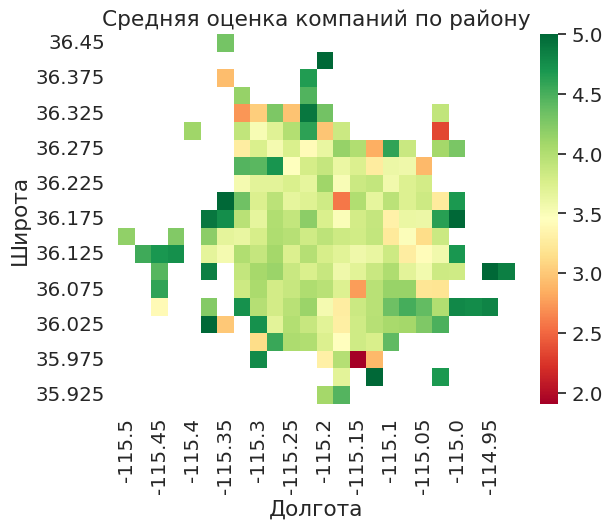

In [17]:
sns.heatmap(neighborhood_rating, cmap='RdYlGn')
plt.ylabel('Широта')
plt.xlabel('Долгота')
plt.title('Средняя оценка компаний по району')
plt.show()

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

Если в районе мало компаний, по ним уже нельзя оценивать район так как он уже не характеризуется компаниями находящимися в нём. Примером, в котором этот недостаток существенен - случай когда район это заповедная зона, западнее Лас-Вегаса, в котором расположено всего несколько бизнесов. Маленький бизнес "закрашивает" целый район, и расширяет город на рейтинговой карте, делая её менее информативной. Также видно что на окраине оценки более "экстремальные". Т.е. они сильно отличаются от среднего по всем районам.

В случае, когда цветовая гамма автоматически подстраивается под минимальное и максимальное значения оценки, два примерно одинаковых района могут выглядеть совершенно по разному, если нет сильно плохих районов, т.е. максимальная разность оценок двух районов мала.

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

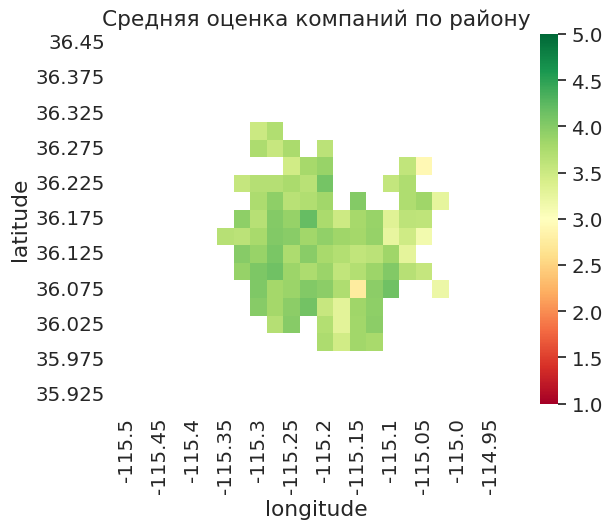

In [18]:
# Создадим булеву маску: число компаний >= 30
neighborhood_count = pd.pivot_table(neighborhoods,
                                    index='latitude',
                                    columns='longitude',
                                    values='name',
                                    aggfunc='count')

neighborhood_count = neighborhood_count.iloc[::-1]  # Также реверс таблицы

mask_count = neighborhood_count < 30
plt.title('Средняя оценка компаний по району')
fig3 = sns.heatmap(neighborhood_rating,
                   cmap='RdYlGn',
                   mask=mask_count,
                   vmin=1,
                   vmax=5)

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:** 

В сравнении с предыдущим, полученный график выглядит куда более сбалансированным, без сильно плохих и очень хороших районов, при этом видно, что на первом графике, у крайних районов в целом были более высокие оценки, чем у тех что в центре, и эти районы оказались районами с небольшим числом компаний, они перестали отображаться на 2-м графике. Т.е. игнорирование районов с небольшим числом компаний также сбалансировало график.

#### 3. Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [19]:
# Маска ресторана
rest_mask = neighborhoods["categories"].str.contains("restaurant", case=False)
rest_mask = rest_mask.fillna(value=False)

# Только рестораны с > 5 отзывами
restaurants = neighborhoods[rest_mask]
restaurants = restaurants[restaurants['Число отзывов'] > 5]

В данном случае будем брать среднее средних, т.к. нас интересует качество ресторанов в районе.

In [20]:
restaurants_rating = pd.pivot_table(restaurants,
                                    index='latitude',
                                    columns='longitude',
                                    values='Средняя оценка',
                                    aggfunc='mean')

restaurants_rating = restaurants_rating.iloc[::-1]

Оставим только интересующие нас рестораны

In [21]:
# Булева маска: число компаний >= 10
rest_count = pd.pivot_table(restaurants,
                            index='latitude',
                            columns='longitude',
                            values='name',
                            aggfunc='count')

rest_count = rest_count.iloc[::-1]

mask_rest_count = rest_count >= 10
restaurants_rating = restaurants_rating[mask_rest_count]

Отобразим рейтинг по районам на графике

In [22]:
fig4 = go.Figure()
restaurants_rating = restaurants_rating.iloc[:, 1:]
fig4.add_trace(
    go.Heatmap(
        z=restaurants_rating.values.tolist(),  # данные
        x=restaurants_rating.columns.tolist(),  # имена столбцов 
        y=restaurants_rating.index.tolist(),  # имена строк
        colorscale='RdYlGn',
        hovertemplate='Долгота:%{x}<br>Широта:%{y}<br>Средняя оценка:%{z:.2f}',
        zmin=1,
        zmax=5  # цветовая схема
    ))

fig4.update_layout(title='Средняя оценка ресторанов в районе',
                   xaxis_title='Долгота',
                   yaxis_title='Широта',
                   height=700,
                   width=700)

fig4.show()
plotly.offline.plot(fig4, filename='map3.html', auto_open=False)

'map3.html'

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** <...>

Ограничения снизу на число отзывов, позволяет считать оценку каждого ресторана как среднее оценок, посетителей. Чем больше отзывов, тем больше вероятность что средняя оценка соответтсвует реальной оценке ресторана. Ограничение снизу на количество ресторанов в районе позволяет отображать на графике лишь районы в которых достаточно много ресторанов, потому что нельзя судить о "ресторанной стороне" района, если в нём их практически нет.

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [23]:
rest_list = joined[rest_mask]
rest_list = rest_list[rest_list['Число отзывов'] >= 50]
rest_list.columns = [
    'Средняя оценка', 'Число отзывов', 'Название', 'Широта', 'Долгота',
    ' Категории'
]
rest_list = rest_list.sort_values(by='Средняя оценка', ascending=False)

Создадим таблицу для отображения, с округлённой средней оценкой

In [24]:
# Декоративная таблица для просмотра
ans = rest_list.iloc[:, [2, 0, 1, 3, 4, 5]]  # Порядок колонок
ans['Средняя оценка'] = ans['Средняя оценка'].apply(
    lambda x: float("{:.2f}".format(x))).apply(
        str)  # Округление оценки и каст float в str

ans.head(10).style.hide_index()

Название,Средняя оценка,Число отзывов,Широта,Долгота,Категории
"""Lip Smacking Foodie Tours""",4.97,179,36.114537,-115.172678,Food Tours;Restaurants;Event Planning & Services;Food;Hotels;Hotels & Travel;Tours;Walking Tours
"""Pepito Shack""",4.91,65,36.152477,-115.151945,Restaurants;Burgers;Food Stands;Sandwiches;Hot Dogs
"""Bosa Boba Cafe""",4.89,55,36.125960,-115.184846,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee & Tea;Restaurants
"""Garden Grill""",4.87,91,36.166783,-115.286197,Tacos;Street Vendors;Farmers Market;Vegetarian;Mexican;Vegan;Restaurants;Food
"""Brew Tea Bar""",4.85,1165,36.054195,-115.242443,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;Desserts
"""Poppa Naps BBQ""",4.84,104,36.116549,-115.088115,Food Stands;Hot Dogs;Caterers;Restaurants;American (New);Event Planning & Services;Barbeque
"""Zenaida's Cafe""",4.83,180,36.101741,-115.100359,Restaurants;Breakfast & Brunch;Cafes
"""El Frescos Cocina Mexicana""",4.82,191,36.098527,-115.148446,Caterers;Mexican;Restaurants;Food;Event Planning & Services
"""Blaqcat Ultra Hookah Lounge""",4.81,63,36.159742,-115.232738,Adult Entertainment;Lounges;Hookah Bars;Restaurants;Coffee & Tea;Bars;Nightlife;Mediterranean;Food
"""Smooth Eats""",4.81,57,36.167894,-115.140238,Juice Bars & Smoothies;Restaurants;Sandwiches;Comfort Food;Specialty Food;Health Markets;Vegetarian;Food


Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [25]:
best_restaurants = rest_list[rest_list['Средняя оценка'] >= 4.7]

In [26]:
best_restaurants
best_restaurants2 = best_restaurants.assign(
    Ресторан=(['Лучший из лучших'] * 10 + ['Лучший'] *
              (len(best_restaurants) - 10)))
best_restaurants2 = best_restaurants2.assign(sz=[0.1] * 10 + [0.05] *
                                             (len(best_restaurants) - 10))

In [27]:
fig5 = px.scatter_mapbox(best_restaurants2,
                         lat='Широта',
                         lon='Долгота',
                         hover_name="Название",
                         color='Ресторан',
                         size='sz',
                         size_max=10,
                         opacity=1,
                         hover_data={
                             'Широта': False,
                             'Долгота': False,
                             'Ресторан': False,
                             'sz': False,
                             'Средняя оценка': (':.3f')
                         },
                         zoom=10,
                         width=1000,
                         title='Лучшие рестораны',
                         height=700)

# Добавим карту
fig5.update_layout(title_x=0.4, title_y=0.95, mapbox_style="open-street-map")
fig5.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

fig5.show()
plotly.offline.plot(fig5, filename='map4.html', auto_open=False)

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** <...>

Кота Василия можно охарактеризовать как кота, который хочет быть уверен в своём выборе ресторана. Из карты лучших ресторанов города N видно, что большая часть этих ресторанов находиться в западной части города. Коту следует присмотреться к этой части города. 
При этом в целом, качество услуг, оказанных в западных районах, немного лучше чем в восточных, но эти отличия невелики. Стоит отметить что рестораны оцениваются ниже чем прочие компании. Также заметно что в северной части число любых бизнесов невелико. Также можно сделать вывод что компании обычно располагаются вдоль крупных улиц.